In [15]:
%matplotlib qt

%matplotlib inline

In [2]:
import os, glob, platform
import numpy as np
import numpy.matlib
import pickle
import pandas as pd
import pathlib
import matplotlib
import matplotlib.pyplot as plt

import mne
mne.__version__


'1.2.2'

In [3]:
from mne.viz import plot_alignment, snapshot_brain_montage

__BIDS__ Libs

In [4]:
import shutil
from mne.datasets import eegbci
from mne_bids import write_raw_bids, BIDSPath, print_dir_tree, make_dataset_description
from mne_bids.stats import count_events


In [5]:
# Importing behavioral data from experiment 
if platform.system() == 'Darwin':
    mne_dir = os.path.join('/users','alex','Library','CloudStorage','OneDrive-UniversitatdeBarcelona','Projects','Condcision') # mac
if platform.system() == 'Linux':
     mne_dir = os.path.join('/home','freeman','Insync', 'alexisperez@ub.edu', 'OneDrive Biz', 'PROJECTS','Condcision')  # Linux 

In [6]:
#data_dir = os.path.join(mne_dir , 'EEG', 'Pilot01', 'raw',  participant, 'func' )
data_dir = os.path.join(mne_dir , 'EEG', 'CJ', 'raw' )


In [7]:
#['s01', 's02', 's03','s04','s05','s07','s08','s09','s10','s11','s12','s13','s14', 
# 's15', 's16','s17','s18','s19','s20','s21','s22','s23','s24','s25','s26','s27' ]

subjs_list = ['s01', 's02', 's03','s04','s05','s07','s08','s09','s10','s11','s12','s13','s14', 's15', 's16','s17','s18','s19','s20','s21','s22','s23','s24','s25','s26','s27' ]

Gather all the epochs data in one list

In [8]:
epochs = []
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/main_epo.fif',verbose=False)
    epochs.append(epoch.average());
    #print(isubj)

In [9]:
gvaverage = mne.grand_average(epochs[:])

Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


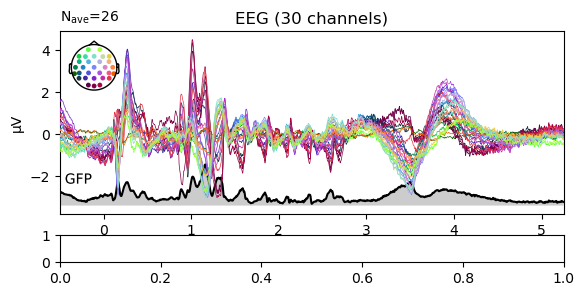

In [16]:
# figsize unit is inches
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6.5, 3.),
                         gridspec_kw=dict(height_ratios=[5, 0.75]))

# we'll put the evoked plot in the upper axes, and the brain below
evoked_idx = 0
brain_idx = 1

# plot the evoked in the desired subplot, and add a line at peak activation
gvaverage.plot(axes=axes[evoked_idx], spatial_colors=True,  gfp=True) #  spatial_colors=True, gfp=True
axes[evoked_idx].axvline(0, color='#66CCEE', ls='--')
axes[evoked_idx].axvline(0.75+(0.25*7), color='red', ls='--')
axes[evoked_idx].axvline(0.75, color='red', ls='--')
for istim in range(6):
    axes[evoked_idx].axvline(0.75+0.25*(istim+1), color='green', ls='--')



Calculate the evoked responses

In [18]:
all_epochs = []
all_rawdata = [None] * np.size(subjs_list)
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/main_epo.fif',verbose=False)
    subj_data = {'epoch_dat' : epoch.get_data(), 'metadata' :  epoch.metadata}
    all_rawdata[isubj] =  subj_data
    all_epochs.append(epoch);
    epoch.metadata

In [19]:
nreps = [0, 1, 2];
all_evoks = []

for irep in nreps:
    nreplist = []
    for isubj, subject_id in enumerate(subjs_list):
        epoch = all_epochs[isubj]
        mdata = epoch.metadata.copy()
        mdata.reset_index(inplace = True)
        sel_epos = mdata[mdata.nrep == irep].index;  
        nreplist.append(epoch[sel_epos].average());
        #all_evoks[irep] = epoch[sel_epos].average();
    all_evoks.append(nreplist)      
        

In [20]:
nreps = [0, 1, 2];
rep_gvaverage = [None] * 3
for irep in nreps:
   rep_gvaverage[irep] = mne.grand_average(all_evoks[irep])
    

Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


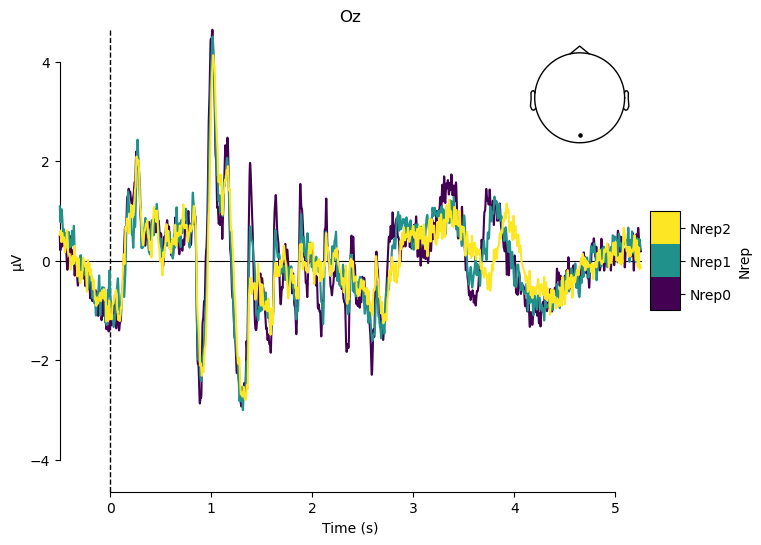

[<Figure size 800x600 with 3 Axes>]

In [21]:
mne.viz.plot_compare_evokeds(dict(Nrep0=rep_gvaverage[0], Nrep1=rep_gvaverage[1],Nrep2=rep_gvaverage[2]), picks = ['Oz'], cmap=('Nrep', 'viridis'))


In [25]:
all_rawdata['metadata'].deci

TypeError: list indices must be integers or slices, not str

In [22]:
all_rawdata[ival]['metadata'].deci

NameError: name 'ival' is not defined

In [23]:
plt.hist(all_rawdata[ival]['metadata'].dv)

NameError: name 'ival' is not defined

In [24]:
preds.shape

NameError: name 'preds' is not defined

In [673]:
16*np.log(2)+31

42.090354888959126

In [647]:
scorer(dv[test_ix],preds)

0.0883323104091402

In [28]:
time = gvaverage.times
n_time = len(time)
#%%capture --no-display
clf = LinearSVR()
a = tm.time() 
nfold = 5 # folds for crossvalidations
n_time = len(time)
nSubj = np.size(subjs_list)
scorer_deci_subjs = np.zeros((nSubj,n_time))
scorer_deci_fold_subjs = np.zeros((nfold,n_time))
lab = preprocessing.LabelEncoder()

for ival, isubj in enumerate(subjs_list):
    print(ival)
    Y = all_rawdata[ival]['epoch_dat'] 

    dv  = np.array(np.abs(all_rawdata[ival]['metadata'].DV))
   # dv = lab.fit_transform(dv)
    
    #dv = lab.fit_transform(dv)
    binned_dv = np.digitize(dv, bins = np.array([ 0,0.3 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(binned_dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], dv[train_ix])
            preds = clf.predict(X = Ytime[test_ix])
            scorer_deci_fold_subjs[ifold, it] = scorer(dv[test_ix],preds)
            
    scorer_deci_subjs[ival, : ] = np.mean(scorer_deci_fold_subjs, axis = 0)
b = tm.time()                    

NameError: name 'LinearSVR' is not defined

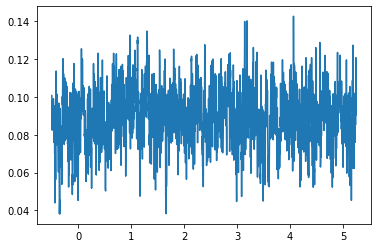

In [659]:
plt.plot(time, np.squeeze(np.mean(scorer_deci_subjs,axis = 0)))
#ax = plt.gca()
#ax.set_ylim([0.45, 0.55])

In [656]:
ival

25

In [626]:
time = gvaverage.times
n_time = len(time)
#%%capture --no-display
clf = SVC(kernel='linear')
clf = SVC(kernel='linear', probability=True)
a = tm.time() 
nfold = 5 # folds for crossvalidations
n_time = len(time)
nSubj = np.size(subjs_list)
scorer_deci_subjs = np.zeros((nSubj,n_time))
scorer_deci_fold_subjs = np.zeros((nfold,n_time))
lab = preprocessing.LabelEncoder()

for ival, isubj in enumerate(subjs_list):
    print(ival)
    Y = all_rawdata[ival]['epoch_dat'] 
    all_rawdata[ival]['metadata']['condv'] = 'C'
    all_rawdata[ival]['metadata'].loc[all_rawdata[ival]['metadata']['cond']== 1, 'condv'] =  'D'
    dv  = np.array(all_rawdata[ival]['metadata'].condv)
    dv = lab.fit_transform(dv)
    
    #dv = lab.fit_transform(dv)
   # binned_dv = np.digitize(dv, bins = np.array([ -0.3,0,0.3 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], dv[train_ix])
            preds = clf.predict(X = Ytime[test_ix])
            scorer_deci_fold_subjs[ifold, it] = prob_scorer(dv[test_ix],preds)
            
    scorer_deci_subjs[ival, : ] = np.mean(scorer_deci_fold_subjs, axis = 0)
b = tm.time()                    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


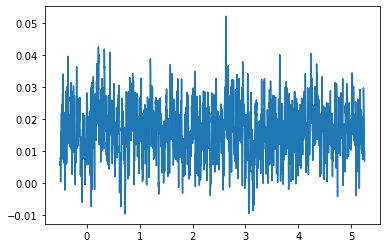

In [652]:
plt.plot(time, np.squeeze(np.mean(scorer_deci_subjs,axis = 0)))
#ax = plt.gca()
#ax.set_ylim([0.45, 0.55])

(0.45, 0.55)

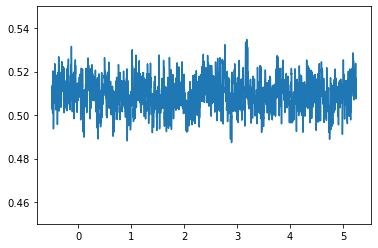

In [602]:
plt.plot(time, np.squeeze(np.mean(scorer_deci_subjs,axis = 0)))
ax = plt.gca()
ax.set_ylim([0.45, 0.55])

# Loading independent stimuli data

In [427]:
st_epochs = []
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/mainstim_epo.fif',verbose=False)
    st_epochs.append(epoch.average());
    #print(isubj)

In [428]:
st_gvaverage = mne.grand_average(st_epochs[:])

Interpolating bad channels
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 30 sensor positions
Interpolating 1 sensors
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


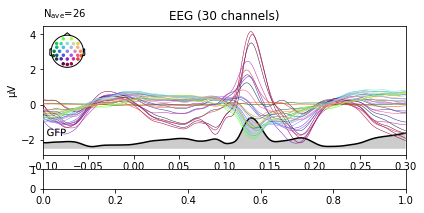

In [429]:
# figsize unit is inches
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6.5, 3.),
                         gridspec_kw=dict(height_ratios=[5, 0.75]))

# we'll put the evoked plot in the upper axes, and the brain below
evoked_idx = 0
brain_idx = 1

# plot the evoked in the desired subplot, and add a line at peak activation
st_gvaverage.plot(axes=axes[evoked_idx], spatial_colors=True,  gfp=True) #  spatial_colors=True, gfp=True
axes[evoked_idx].axvline(0, color='#66CCEE', ls='--')
axes[evoked_idx].axvline(0.75+(0.25*7), color='red', ls='--')
axes[evoked_idx].axvline(0.75, color='red', ls='--')
for istim in range(6):
    axes[evoked_idx].axvline(0.75+0.25*(istim+1), color='green', ls='--')



Calculate the evoked responses

In [430]:
all_st_epochs = []
all_st_rawdata = [None] * np.size(subjs_list)
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/mainstim_epo.fif',verbose=False)
    subj_data = {'epoch_dat' : epoch.get_data(), 'metadata' :  epoch.metadata}
    all_st_rawdata[isubj] =  subj_data
    all_st_epochs.append(epoch);
    epoch.metadata

In [431]:
nreps = [0, 1, 2];
all_st_evoks = []

for irep in nreps:
    nreplist = []
    for isubj, subject_id in enumerate(subjs_list):
        epoch = all_st_epochs[isubj]
        mdata = epoch.metadata.copy()
        mdata.reset_index(inplace = True)
        sel_epos = mdata[mdata.nrep == irep].index;  
        nreplist.append(epoch[sel_epos].average());
        #all_evoks[irep] = epoch[sel_epos].average();
    all_st_evoks.append(nreplist)      
        

In [432]:
nreps = [0, 1, 2];
st_rep_gvaverage = [None] * 3
for irep in nreps:
   st_rep_gvaverage[irep] = mne.grand_average(all_st_evoks[irep])
    

Interpolating bad channels
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 30 sensor positions
Interpolating 1 sensors
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']
Interpolating bad channels
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 30 sensor positions
Interpolating 1 sensors
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']
Interpolating bad channels
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 30 sensor positions
Interpolating 1 sensors
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


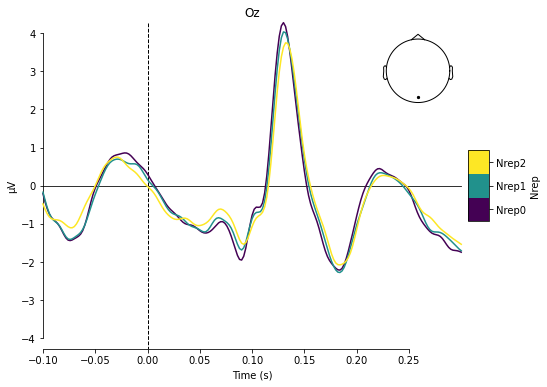

[<Figure size 576x432 with 3 Axes>]

In [433]:
mne.viz.plot_compare_evokeds(dict(Nrep0=st_rep_gvaverage[0], Nrep1=st_rep_gvaverage[1],Nrep2=st_rep_gvaverage[2]), picks = ['Oz'], cmap=('Nrep', 'viridis'))


# Decoding

In [21]:
import sys
path_utils = '/Users/alex/Library/CloudStorage/OneDrive-UniversitatdeBarcelona/TOOLBOXES/decoding_toolbox_py/helper_funcs' 
sys.path.append(path_utils)

In [22]:
import DecToolbox as dt

In [187]:
from base_stats import corr_linear_circular

def circ_corr_fun(Y, X):
    # Y is a matrix with trials x channels x timepoints
    # X is a vector with the orientation of each stimulus in radians
    n_trial, n_chan, n_time = Y.shape
    Yreshape = Y.reshape([-1, n_chan * n_time])
    # linear circular correlation between MEG and stim angle
    _, R2, _ = corr_linear_circular(Yreshape, X)
    R2 = R2.reshape([n_chan, n_time])
    return R2


# Circular correlation

In [456]:
%matplotlib inline
import pickle
import matplotlib.pyplot as plt
import numpy as np

from mne import read_epochs
from mne.decoding import SlidingEstimator,GeneralizingEstimator

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.svm import LinearSVR, SVC
from base_stats import corr_linear_circular

#from jr.gat import subscore
#from jr.gat import AngularRegression, scorer_angle
#from jr.stats import corr_linear_circular
#from jr.plot import pretty_gat, pretty_decod

In [ ]:
Y = all_st_rawdata[0]['epoch_dat']
X = np.array(all_st_rawdata[0]['metadata'].orient)
phi = X

885     154.526717
886      40.966482
887     109.033868
888      90.298149
889      69.557076
           ...    
4308    159.156006
4309    129.018426
4310     19.434939
4311     47.452575
4312    172.162148
Name: orient, Length: 1563, dtype: float64

In [201]:
nSubj = np.size(subjs_list)
R_subjs = np.zeros((nSubj,n_time))
Rch_subjs = np.zeros((nSubj,n_chan, n_time))

for ival, isubj in enumerate(subjs_list):
    R2 = circ_corr_fun(all_st_rawdata[ival]['epoch_dat'], np.deg2rad(all_st_rawdata[ival]['metadata'].orient))
    R_subjs[ival, :] = np.squeeze(np.mean(R2,0))
    Rch_subjs[ival, :, :] = R2


In [202]:
evoked = st_gvaverage.copy()

No projector specified for this dataset. Please consider the method self.add_proj.


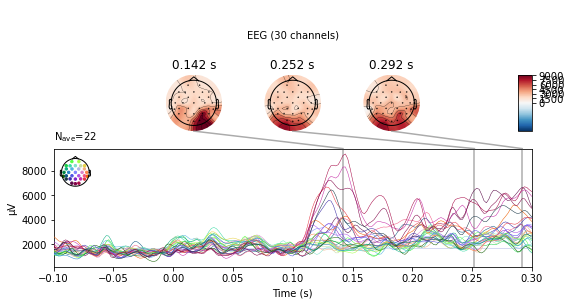

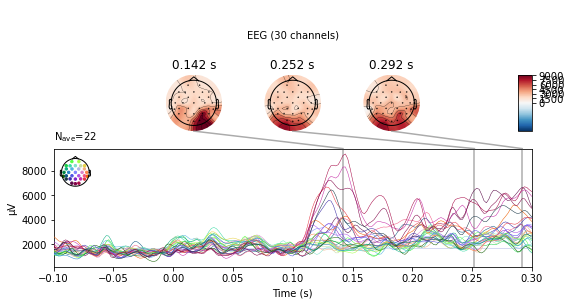

In [203]:
evoked.data = np.mean(Rch_subjs,axis = 0)
evoked.plot_joint()

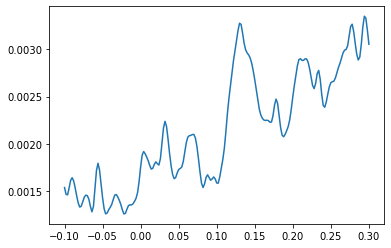

In [32]:
plt.plot(time, np.squeeze(np.mean(R_subjs,axis = 0)))

__MULTIVARIATE CIRCULAR CORRELATION__ (activity from independent channels)

In [33]:
from classifier_funcs import AngularRegression, scorer_angle
from sklearn.preprocessing import StandardScaler
import time as tm

In [88]:
%%capture --no-display
clf_angle = make_pipeline(AngularRegression(clf=LinearSVR()))
a = tm.time()
clf_angle = make_pipeline(AngularRegression(clf=LinearSVR())) # defining decoder  
nfold = 5 # folds for crossvalidations

nSubj = np.size(subjs_list)
scorer_ori_subjs = np.zeros((nSubj,n_time))
scorer_fold_subjs = np.zeros((nfold,n_time))

for ival, isubj in enumerate(subjs_list):
    time = all_st_epochs[ival].times
    label = all_st_epochs[ival].ch_names
    Y = all_st_rawdata[ival]['epoch_dat'] 
    phi  = np.array(all_st_rawdata[ival]['metadata'].orient) 
    binned_phi = np.digitize(phi, bins = np.array([  0, 45, 90, 135 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(binned_phi, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf_angle.fit( Ytime[train_ix,:], np.deg2rad(phi[train_ix]))
            preds = clf_angle.predict(X = Ytime[test_ix])
            scorer_fold_subjs[ifold, it] = scorer_angle(np.deg2rad(phi[test_ix]),preds)
            
    scorer_ori_subjs[ival, : ] = np.mean(scorer_fold_subjs, axis = 0)
b = tm.time()                    

In [89]:
(b-a)/60

31.28172883192698

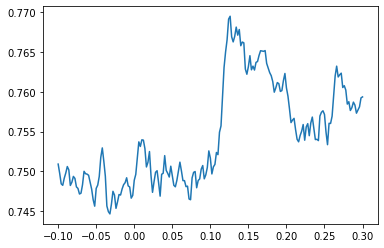

In [90]:
plt.plot(time, np.mean(scorer_ori_subjs, axis = 0))


911     0.667425
924     0.325678
929     0.515674
939     0.762164
1006    0.472384
          ...   
4308   -0.342490
4309    0.470828
4310   -0.906299
4311    0.914434
4312   -0.050163
Name: dv, Length: 1139, dtype: float64

In [646]:
# Scorer: non parametric R²
def scorer(y_true, y_pred):
    from scipy.stats import spearmanr
    rho, p = spearmanr(y_true, y_pred)
    return rho

In [403]:
#%%capture --no-display
clf = LinearSVR()
a = tm.time() 
nfold = 5 # folds for crossvalidations

nSubj = np.size(subjs_list)
scorer_deci_subjs = np.zeros((nSubj,n_time))
scorer_deci_fold_subjs = np.zeros((nfold,n_time))

for ival, isubj in enumerate(subjs_list):
    Y = all_st_rawdata[ival]['epoch_dat'] 
    dv  = np.array(all_st_rawdata[ival]['metadata'].dv) 
    binned_dv = np.digitize(dv, bins = np.array([ -0.3,0,0.3 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(binned_dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], np.deg2rad(dv[train_ix]))
            preds = clf.predict(X = Ytime[test_ix])
            scorer_deci_fold_subjs[ifold, it] = scorer(np.deg2rad(dv[test_ix]),preds)
            
    scorer_deci_subjs[ival, : ] = np.mean(scorer_deci_fold_subjs, axis = 0)
b = tm.time()                    

/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt

In [548]:
time = st_gvaverage.times
n_time = len(time)
#%%capture --no-display
clf = SVC(kernel='linear', probability=True)
a = tm.time() 
nfold = 5 # folds for crossvalidations
n_time = len(time)
nSubj = np.size(subjs_list)
scorer_cond_subjs = np.zeros((nSubj,n_time))
scorer_cond_fold_subjs = np.zeros((nfold,n_time))
lab = preprocessing.LabelEncoder()

for ival, isubj in enumerate(subjs_list):
    print(ival)
    Y = all_st_rawdata[ival]['epoch_dat'] 
    dv  = np.array(all_st_rawdata[ival]['metadata'].stim_cond)
    dv = lab.fit_transform(dv)
    
    FoldsIdx = dt.CreateFolds(dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], dv[train_ix])
            preds = clf.predict(X = Ytime[test_ix])
            scorer_cond_fold_subjs[ifold, it] = prob_scorer(dv[test_ix],preds)
            
    scorer_cond_subjs[ival, : ] = np.mean(scorer_cond_fold_subjs, axis = 0)
b = tm.time()                    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


In [553]:
(b-a)/60

275.9623707652092

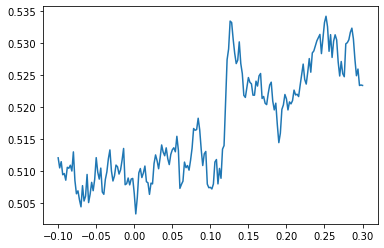

In [551]:
plt.plot(time, np.mean(scorer_cond_subjs, axis = 0))


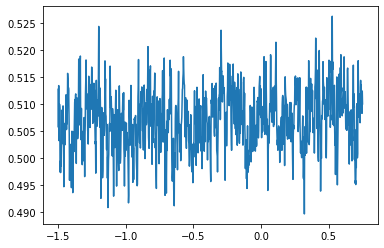

In [558]:
plt.plot(time, np.mean(scorer_respdeci_subjs, axis = 0))

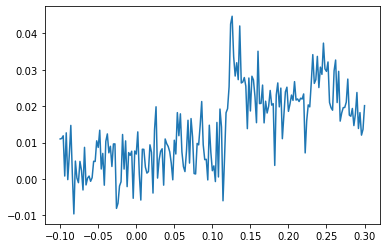

In [405]:
plt.plot(time, np.mean(scorer_deci_subjs, axis = 0))


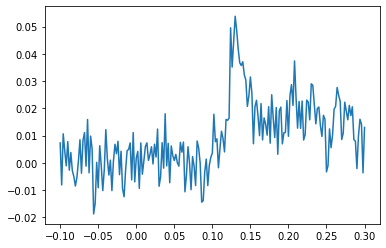

In [425]:
plt.plot(time, np.mean(loc_scorer_deci_subjs, axis = 0))


idx_Train = mat['folds'][0][0].T
idx_Test =mat['folds'][1][0][0].T

#Folds_ori = Folds.copy()
dat = {}
dat['X_train'] = G[idx_Train-1] # -1 to correct for matlab to python indexes
dat['X_test'] = G[idx_Test-1]
dat['Y_train'] = np.squeeze(Y[:,sel_t, idx_Train-1])
dat['Y_test'] = np.squeeze(Y[:,sel_t, idx_Test-1])
dat['phi_train'] = phi[idx_Train-1]
dat['phi_test'] = phi[idx_Test-1]

Create design matrix

# Localizer

In [94]:
loc_st_epochs = []
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/locstim_epo.fif',verbose=False)
    loc_st_epochs.append(epoch.average());
    #print(isubj)

In [95]:
loc_st_gvaverage = mne.grand_average(loc_st_epochs[:])

Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


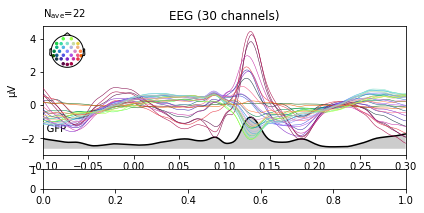

In [96]:
# figsize unit is inches
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6.5, 3.),
                         gridspec_kw=dict(height_ratios=[5, 0.75]))

# we'll put the evoked plot in the upper axes, and the brain below
evoked_idx = 0
brain_idx = 1

# plot the evoked in the desired subplot, and add a line at peak activation
loc_st_gvaverage.plot(axes=axes[evoked_idx], spatial_colors=True,  gfp=True) #  spatial_colors=True, gfp=True
axes[evoked_idx].axvline(0, color='#66CCEE', ls='--')
axes[evoked_idx].axvline(0.75+(0.25*7), color='red', ls='--')
axes[evoked_idx].axvline(0.75, color='red', ls='--')
for istim in range(6):
    axes[evoked_idx].axvline(0.75+0.25*(istim+1), color='green', ls='--')



In [150]:
all_loc_st_rawdata[0]['metadata'].shape

(954, 6)

In [148]:
all_loc_st_rawdata[0]['epoch_dat'].shape

(954, 32, 201)

In [142]:
all_loc_st_epochs = []
all_loc_st_rawdata = [None] * np.size(subjs_list)
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/locstim_epo.fif',verbose=False)
    subj_data = {'epoch_dat' : epoch.get_data(), 'metadata' :  epoch.metadata}
    all_loc_st_rawdata[isubj] =  subj_data
    all_loc_st_epochs.append(epoch);
    epoch.metadata

4       134.988857
5        90.011670
6        22.517241
7       112.471615
8        44.977187
           ...    
5191     67.494428
5192    134.988857
5193    157.506098
5194     22.517241
5195     90.011670
Name: rads, Length: 954, dtype: float64

In [205]:
nSubj = np.size(subjs_list)
R_loc_subjs = np.zeros((nSubj,n_time))
Rch_loc_subjs = np.zeros((nSubj,n_chan, n_time))


for ival, isubj in enumerate(subjs_list):
    R2_loc = circ_corr_fun(all_loc_st_rawdata[ival]['epoch_dat'], all_loc_st_rawdata[ival]['metadata'].rads)
    R_loc_subjs[ival, :] = np.squeeze(np.mean(R2_loc,0))
    Rch_loc_subjs[ival, :, :] = R2_loc


In [206]:
evoked = loc_st_gvaverage.copy()

No projector specified for this dataset. Please consider the method self.add_proj.


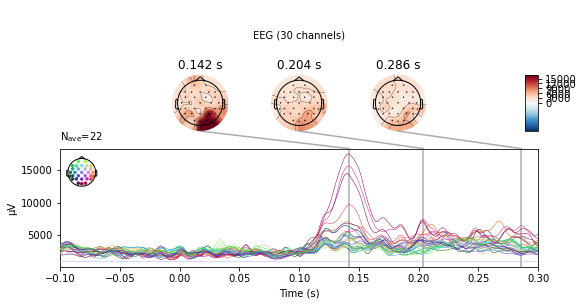

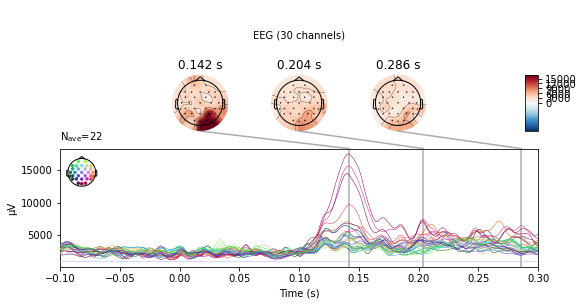

In [207]:
evoked.data = np.mean(Rch_loc_subjs,axis = 0)
evoked.plot_joint()

__MULTIVARIATE CIRCULAR CORRELATION__ (activity from independent channels)

In [173]:
from classifier_funcs import AngularRegression, scorer_angle
from sklearn.preprocessing import StandardScaler
import time as tm

In [214]:
from sklearn.model_selection import LeaveOneOut

loo = LeaveOneOut()
loo.get_n_splits(phi)

734

In [226]:
a = numpy.empty((3,3,))
a

array([[576.   ,   0.   ,   2.475],
       [  0.   , 302.4  ,  -4.136],
       [  0.   ,   0.   ,   1.   ]])

In [235]:
Y.shape

(734, 32, 201)

In [271]:
from scipy.stats import circmean

In [ ]:
binned_phi = np.digitize(phi, bins = cfg['bins']) # bins collapsing degrees by similarity
FoldsIdx = dt.CreateFolds(binned_phi, Y, nfold)
loc_scorer_ori_subjs = np.zeros((nSubj,n_time))
loc_scorer_fold_subjs = np.zeros((1,n_time))
for it in range(len(time)):
    predmat = np.empty([Y.shape[0],nfold])
    predmat[:] = np.nan
    for ifold, fold in enumerate(FoldsIdx):

        train_ix = fold['train_index']
        test_ix = fold['test_index']

        Ytime = Y[:,:,it]
        scaler = StandardScaler().fit(Ytime)
        Ytime = scaler.transform(Ytime)

        clf_angle.fit( Ytime[train_ix,:], np.deg2rad(phi[train_ix]))
        predmat[test_ix,ifold] = clf_angle.predict(X = Ytime[test_ix])
    mean_predmat = circmean(predmat, axis = 1, nan_policy='omit')
    loc_scorer_fold_subjs[:,it] = scorer_angle(np.deg2rad(phi),mean_predmat)

loc_scorer_ori_subjs[ival, : ] = loc_scorer_fold_subjs

/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt

In [381]:
preds.shape

(191,)

In [359]:
train_ix = fold['train_index']
test_ix = fold['test_index']    
Ytime = Y[:,:,it]


In [384]:
def circ_decoding_time(Y, phi, cfg ): 
    phi = np.array(phi)
    ntrials = Y.shape[0]
    scorer_fold = np.zeros((nfold,n_time))
    preds = np.zeros((ntrials,n_time))
    predmat = np.empty([ntrials,nfold,n_time])
    predmat[:] = np.nan
    binned_phi = np.digitize(phi, bins = cfg['bins']) # bins collapsing degrees by similarity
    FoldsIdx = dt.CreateFolds(binned_phi, Y, nfold)
    for it in range(len(time)):
        for ifold, fold in enumerate(FoldsIdx):           
            train_ix = fold['train_index']
            test_ix = fold['test_index']    
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)           
            clf_angle.fit( Ytime[train_ix,:], np.deg2rad(phi[train_ix]))
            preds = clf_angle.predict(X = Ytime[test_ix])
            predmat[test_ix,ifold,it] = preds
            scorer_fold[ifold, it] = scorer_angle(np.deg2rad(phi[test_ix]),preds)            
            
    scorer = np.mean(scorer_fold, axis = 0)
            
       # mean_predmat = circmean(predmat, axis = 1, nan_policy='omit')
       # preds[:,it] = mean_predmat
       # scorer[:,it] = scorer_angle(np.deg2rad(phi),mean_predmat)
    return scorer, predmat
            


In [ ]:
%%capture --no-display
t1 = tm.time()
nSubj = np.size(subjs_list)
loc_scorer_ori_subjs = np.zeros((nSubj,n_time))
loc_preds_ori_subjs = nSubj*[None]

time = all_loc_st_epochs[0].times

cfg = {'time' : time, 'nfolds' : nfold, 'bins' : np.array([  0, 45, 90, 135 ])}

for ival, isubj in enumerate(subjs_list):
    Y = all_loc_st_rawdata[ival]['epoch_dat'] 
    phi  = np.rad2deg(all_loc_st_rawdata[ival]['metadata'].rads)
    loc_scorer_ori_subjs[ival, :], loc_preds_ori_subjs[ival] = circ_decoding_time(Y, phi, cfg)

t1 = tm.time()

/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt

In [ ]:
%%capture --no-display
a = tm.time()
clf = LinearSVR() # defining decoder  
nfold = 5 # folds for crossvalidations

nSubj = np.size(subjs_list)
loc_scorer_deci_subjs = np.zeros((nSubj,n_time))
loc_scorer_deci_fold_subjs = np.zeros((nfold,n_time))

for ival, isubj in enumerate(subjs_list):
    Y = all_loc_st_rawdata[ival]['epoch_dat'] 
    phi  = np.array(np.rad2deg(all_loc_st_rawdata[ival]['metadata'].rads)) 
    binned_phi = np.digitize(phi, bins = np.array([  0, 45, 90, 135 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(binned_phi, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf_angle.fit( Ytime[train_ix,:], np.deg2rad(phi[train_ix]))
            preds = clf_angle.predict(X = Ytime[test_ix])
            loc_scorer_fold_subjs[ifold, it] = scorer_angle(np.deg2rad(phi[test_ix]),preds)
            
    loc_scorer_ori_subjs[ival, : ] = np.mean(loc_scorer_fold_subjs, axis = 0)
b = tm.time()                    

In [ ]:
%%capture --no-display
a = tm.time()
clf_angle = make_pipeline(AngularRegression(clf=LinearSVR())) # defining decoder  
nfold = 5 # folds for crossvalidations

nSubj = np.size(subjs_list)
loc_scorer_ori_subjs = np.zeros((nSubj,n_time))
loc_scorer_fold_subjs = np.zeros((nfold,n_time))

for ival, isubj in enumerate(subjs_list):
    time = all_loc_st_epochs[ival].times
    label = all_loc_st_epochs[ival].ch_names
    Y = all_loc_st_rawdata[ival]['epoch_dat'] 
    phi  = np.array(np.rad2deg(all_loc_st_rawdata[ival]['metadata'].rads)) 
    binned_phi = np.digitize(phi, bins = np.array([  0, 45, 90, 135 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(binned_phi, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf_angle.fit( Ytime[train_ix,:], np.deg2rad(phi[train_ix]))
            preds = clf_angle.predict(X = Ytime[test_ix])
            loc_scorer_fold_subjs[ifold, it] = scorer_angle(np.deg2rad(phi[test_ix]),preds)
            
    loc_scorer_ori_subjs[ival, : ] = np.mean(loc_scorer_fold_subjs, axis = 0)
b = tm.time()                    

In [409]:
from scipy import signal

(array([88., 92., 92.,  0., 99., 92.,  0., 91., 95., 85.]),
 array([  0.        ,  15.75060979,  31.50121958,  47.25182936,
         63.00243915,  78.75304894,  94.50365873, 110.25426852,
        126.00487831, 141.75548809, 157.50609788]),
 <BarContainer object of 10 artists>)

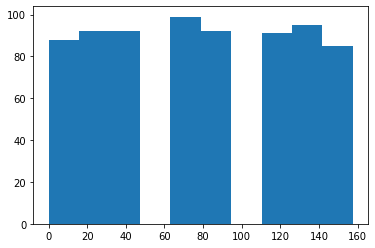

In [419]:
plt.hist(np.rad2deg(all_loc_st_rawdata[ival]['metadata'].rads))

(array([180.,   0.,   0.,   0., 176., 191.,   0.,   0.,   0., 187.]),
 array([-1.00000000e+00, -8.00049527e-01, -6.00099053e-01, -4.00148580e-01,
        -2.00198106e-01, -2.47632604e-04,  1.99702841e-01,  3.99653314e-01,
         5.99603788e-01,  7.99554261e-01,  9.99504735e-01]),
 <BarContainer object of 10 artists>)

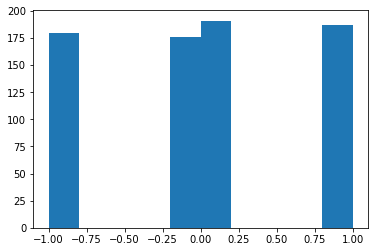

In [420]:
plt.hist(signal.sawtooth(4 * (all_loc_st_rawdata[ival]['metadata'].rads), 0.5))

In [418]:
np.unique(signal.sawtooth(4 * (all_loc_st_rawdata[ival]['metadata'].rads), 0.5))

array([-1.00000000e+00, -9.99481350e-01, -1.26154737e-03, -2.71016954e-04,
        2.47632604e-04,  7.66282162e-04,  9.98986085e-01,  9.99504735e-01])

In [423]:
#%%capture --no-display
clf = LinearSVR()
a = tm.time() 
nfold = 5 # folds for crossvalidations

nSubj = np.size(subjs_list)
loc_scorer_deci_subjs = np.zeros((nSubj,n_time))
loc_scorer_deci_fold_subjs = np.zeros((nfold,n_time))

for ival, isubj in enumerate(subjs_list):
    Y = all_loc_st_rawdata[ival]['epoch_dat'] 
    dv  = signal.sawtooth(4 * (all_loc_st_rawdata[ival]['metadata'].rads), 0.5)
    binned_dv = np.digitize(dv, bins = np.array([ -0.3,0,0.3 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(binned_dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], np.deg2rad(dv[train_ix]))
            preds = clf.predict(X = Ytime[test_ix])
            loc_scorer_deci_fold_subjs[ifold, it] = scorer(np.deg2rad(dv[test_ix]),preds)
            
    loc_scorer_deci_subjs[ival, : ] = np.mean(loc_scorer_deci_fold_subjs, axis = 0)
b = tm.time()                    

/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,
/Users/alex/opt

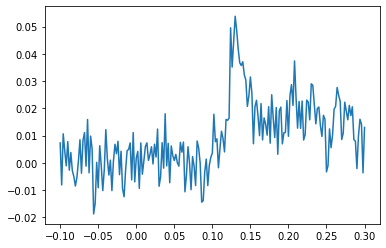

In [424]:
plt.plot(time, np.mean(loc_scorer_deci_subjs, axis = 0))

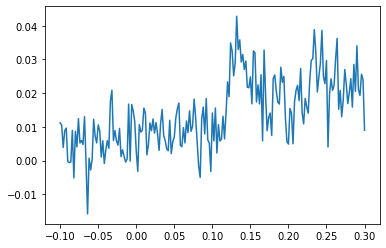

In [399]:
plt.plot(time, np.mean(scorer_deci_subjs, axis = 0))


# Response phase

In [ ]:
resp_epochs = []
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/mainresp_epo.fif',verbose=False)
    resp_epochs.append(epoch.average());
    #print(isubj)

In [436]:
resp_gvaverage = mne.grand_average(resp_epochs[:])

Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


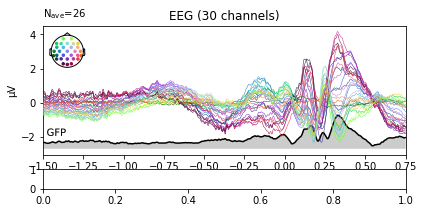

In [437]:
# figsize unit is inches
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6.5, 3.),
                         gridspec_kw=dict(height_ratios=[5, 0.75]))

# we'll put the evoked plot in the upper axes, and the brain below
evoked_idx = 0
brain_idx = 1

# plot the evoked in the desired subplot, and add a line at peak activation
resp_gvaverage.plot(axes=axes[evoked_idx], spatial_colors=True,  gfp=True) #  spatial_colors=True, gfp=True
axes[evoked_idx].axvline(0, color='#66CCEE', ls='--')
axes[evoked_idx].axvline(0.75+(0.25*7), color='red', ls='--')
axes[evoked_idx].axvline(0.75, color='red', ls='--')
for istim in range(6):
    axes[evoked_idx].axvline(0.75+0.25*(istim+1), color='green', ls='--')



Calculate the evoked responses

In [443]:
all_resp_epochs = []
all_resp_rawdata = [None] * np.size(subjs_list)
for isubj, subject_id in enumerate(subjs_list):
    preproc_path = os.path.join(mne_dir , 'Preproc', 'EEG', 'Condcision_CJ_EEG', subject_id);
    epoch = mne.read_epochs(preproc_path + '/mainresp_epo.fif',verbose=False)
    subj_data = {'epoch_dat' : epoch.get_data(), 'metadata' :  epoch.metadata}
    all_resp_rawdata[isubj] =  subj_data
    all_resp_epochs.append(epoch);
    epoch.metadata

In [444]:
nreps = [0, 1, 2];
all_resp_evoks = []

for irep in nreps:
    nreplist = []
    for isubj, subject_id in enumerate(subjs_list):
        epoch = all_resp_epochs[isubj]
        mdata = epoch.metadata.copy()
        mdata.reset_index(inplace = True)
        sel_epos = mdata[mdata.nrep == irep].index;  
        nreplist.append(epoch[sel_epos].average());
        #all_evoks[irep] = epoch[sel_epos].average();
    all_resp_evoks.append(nreplist)      
        

In [445]:
nreps = [0, 1, 2];
resp_rep_gvaverage = [None] * 3
for irep in nreps:
   resp_rep_gvaverage[irep] = mne.grand_average(all_resp_evoks[irep])
    

Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']
Identifying common channels ...
Dropped the following channels:
['FT9', 'FCz']


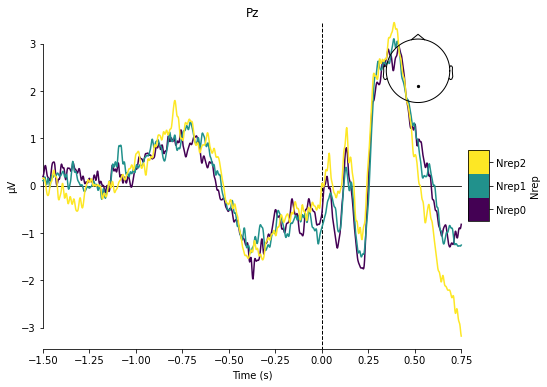

[<Figure size 576x432 with 3 Axes>]

In [450]:
mne.viz.plot_compare_evokeds(dict(Nrep0=resp_rep_gvaverage[0], Nrep1=resp_rep_gvaverage[1],Nrep2=resp_rep_gvaverage[2]), picks = ['Pz'], cmap=('Nrep', 'viridis'))


__Decision decoding__

In [ ]:
from sklearn import preprocessing

In [477]:
# Scorer: non parametric R²
def prob_scorer(y_true, y_pred):
    """Score probabilistic outputs for a single class as the other class is the numerical complement."""
    return roc_auc_score(y_true, y_pred)

In [557]:
time = resp_gvaverage.times
n_time = len(time)
#%%capture --no-display
clf = SVC(kernel='linear')
a = tm.time() 
nfold = 5 # folds for crossvalidations
n_time = len(time)
nSubj = np.size(subjs_list)
scorer_respdeci_subjs = np.zeros((nSubj,n_time))
scorer_respdeci_fold_subjs = np.zeros((nfold,n_time))
lab = preprocessing.LabelEncoder()

for ival, isubj in enumerate(subjs_list):
    print(ival)
    Y = all_resp_rawdata[ival]['epoch_dat'] 
    dv  = np.array(all_resp_rawdata[ival]['metadata'].deci)
    dv = lab.fit_transform(dv)
    binned_dv = np.digitize(dv, bins = np.array([ -0.3,0,0.3 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], dv[train_ix])
            preds = clf.predict(X = Ytime[test_ix])
            scorer_respdeci_fold_subjs[ifold, it] = prob_scorer(dv[test_ix],preds)
            
    scorer_respdeci_subjs[ival, : ] = np.mean(scorer_respdeci_fold_subjs, axis = 0)
b = tm.time()                    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


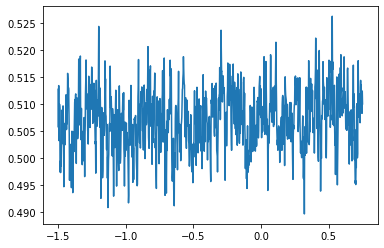

In [558]:
plt.plot(time, np.mean(scorer_respdeci_subjs, axis = 0))

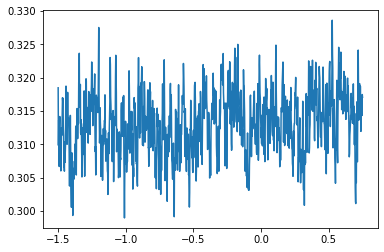

In [502]:
plt.plot(time, np.mean(scorer_respdeci_subjs, axis = 0))

In [501]:
#%%capture --no-display
clf = SVC(kernel='linear', probability=True)
a = tm.time() 
nfold = 5 # folds for crossvalidations
n_time = len(time)
nSubj = np.size(subjs_list)
scorer_respdeci_subjs = np.zeros((nSubj,n_time))
scorer_respdeci_fold_subjs = np.zeros((nfold,n_time))
lab = preprocessing.LabelEncoder()

for ival, isubj in enumerate(subjs_list):
    Y = all_resp_rawdata[ival]['epoch_dat'] 
    dv  = np.array(all_resp_rawdata[ival]['metadata'].deci)
    dv = lab.fit_transform(dv)
    binned_dv = np.digitize(dv, bins = np.array([ -0.3,0,0.3 ]) ) # bins collapsing degrees by similarity

    FoldsIdx = dt.CreateFolds(dv, Y, nfold)
    
    for ifold, fold in enumerate(FoldsIdx):
        train_ix = fold['train_index']
        test_ix = fold['test_index']
        
        for it in range(len(time)):
            
            Ytime = Y[:,:,it]
            scaler = StandardScaler().fit(Ytime)
            Ytime = scaler.transform(Ytime)
            
            clf.fit( Ytime[train_ix,:], dv[train_ix])
            preds = clf.predict(X = Ytime[test_ix])
            scorer_respdeci_fold_subjs[ifold, it] = prob_scorer(dv[test_ix],preds)
            
    scorer_respdeci_subjs[ival, : ] = np.mean(scorer_respdeci_fold_subjs, axis = 0)
b = tm.time()                    

KeyboardInterrupt: 

In [499]:
all_resp_rawdata[ival]['metadata'].columns

Index(['index', 'subj', 'nblock', 'ntrial', 'nrep', 'trial_type', 'cond-1',
       'cond', 'rDV', 'DV', 'resp', 'deci-2', 'deci-1', 'deci', 'corr-1',
       'r_map', 'correct', 'confi', 'RT', 'd1', 'conf_lvl', 'correct-1', 'd2',
       'd3', 'd4', 'd5', 'd6', 'o1', 'o2', 'o3', 'o4', 'o5', 'o6', 'confi-1',
       'conf_lvl-1'],
      dtype='object')

In [500]:
all_resp_rawdata[ival]['metadata']

,index,subj,nblock,ntrial,nrep,trial_type,cond-1,cond,rDV,DV,...,d5,d6,o1,o2,o3,o4,o5,o6,confi-1,conf_lvl-1
893,0,s01,0,0,0,repeat,0,0,0.205880,-0.18,...,-0.091426,-0.944496,2.697000,0.715000,1.903000,1.576000,1.214000,1.549000,0.00,L
906,1,s01,0,0,1,repeat,0,0,0.205880,-0.18,...,-0.091426,-0.944496,2.697000,0.715000,1.903000,1.576000,1.214000,1.549000,-0.10,L
919,2,s01,0,0,2,repeat,0,0,0.205880,-0.18,...,-0.091426,-0.944496,2.697000,0.715000,1.903000,1.576000,1.214000,1.549000,0.60,L
932,3,s01,0,1,0,nonrepeat,0,0,0.745740,-0.08,...,-0.246761,0.711234,1.675000,2.694000,1.910000,1.876000,1.275000,0.672000,0.85,H
945,4,s01,0,1,1,nonrepeat,0,0,0.745740,-0.08,...,-0.246761,0.711234,1.675000,2.694000,1.910000,1.876000,1.275000,0.672000,0.50,L
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4263,259,s01,3,20,1,repeat,0,0,0.717009,-0.31,...,0.368968,-0.664902,3.012000,1.723000,0.300000,2.710000,2.604000,3.010000,0.45,H
4276,260,s01,3,20,2,repeat,0,0,0.717009,-0.31,...,0.368968,-0.664902,3.012000,1.723000,0.300000,2.710000,2.604000,3.010000,0.75,H
4289,261,s01,3,21,0,nonrepeat,0,1,0.769212,0.21,...,0.890997,-0.651651,2.571000,1.207000,0.681000,1.910000,2.399000,1.434000,0.50,H
4302,262,s01,3,21,1,nonrepeat,1,1,0.769212,0.21,...,0.890997,-0.651651,2.571000,1.207000,0.681000,1.910000,2.399000,1.434000,0.85,H


__OTHER ANALYSES__

FORWARD ENCODING MODEL 

In [29]:
nSubj = np.size(subjs_list)

dec_subj = [None] * nSubj
G = [None] * nSubj

for ival, isubj in enumerate(subjs_list):
    time = all_st_epochs[ival].times
    label = all_st_epochs[ival].ch_names
    Y = all_st_rawdata[ival]['epoch_dat']
    Y = np.einsum('kji->jik', Y)
    X = np.array(all_st_rawdata[ival]['metadata'].orient)
    phi = X
    #binned_phi = np.digitize(phi, bins = np.array([  0, 22.5, 45, 67.5, 90, 112.5, 135, 157.5 ]) ) # bins collapsing degrees by similarity
    binned_phi = np.digitize(phi, bins = np.array([  0, 45, 90, 135 ]) ) # bins collapsing degrees by similarity

    numF = Y.shape[0];
    numT = Y.shape[1];
    numN = Y.shape[2];
    numC = 4 # how many channels to use
    G[ival] = binned_phi.copy() # binning/discritizing orientation dimension to assign a balanced number of stimuli to different dat
    binned_phi = (G[ival]-1)*(180/4)
    
    CONDS = np.unique(G[ival])
    nConds = CONDS.size
    nfold = 4
    FoldsIdx = dt.CreateFolds(G[ival], Y, nfold)
    #numC = 8 # how many channels to use

    cfg = dict()
    cfg['kappa'] = 2
    cfg['NumC'] = numC
    cfg['Tuning'] = 'vonmises'#'halfRectCos'
    cfg['offset'] = 0

    design, sortedesign = dt.stim_features(binned_phi, cfg)
    

    Xhat = np.zeros([numC,numN, numT])
    for it in range(numT):
        cfg = dict()
        cfg['cfgE'] = {'gamma': 0.01, 'demean' : True, 'returnPattern' : True}
        cfg['cfgD'] = {'demean' : 'traindata'}
        Xhat[:,:,it] = dt.CV_encoder(design, Y, it, cfg, FoldsIdx)
    
    dec_subj[ival] = Xhat   

In [30]:
plt.imshow(sortedesign, aspect = 'auto')

In [32]:
m_centered = np.zeros((numC,numC, numT, nSubj))
for ival, isubj in enumerate(subjs_list):
    Zhat = dec_subj[ival]
    Zhat_centered = 0*Zhat.copy()
    
    for ic in range(numC): # here trials that match similar label orientation are shifted together x positions (np.roll)
        Zhat_centered[:, G[ival] == (ic+1),:] = np.roll(Zhat[:,G[ival] == (ic+1),:], -ic, axis = 0)
        m_centered[:,ic, :, ival] =  np.mean( Zhat_centered[:,  G[ival] == (ic+1), :], axis = 1)

In [571]:
 m_centered.shape

(8, 8, 201, 22)

In [41]:
# Classify using the average signal in the window 50ms to 300ms
# to focus the classifier on the time interval with best SNR.
clf = make_pipeline(StandardScaler(),
                    LogisticRegression(C=1, solver='liblinear',
                                       multi_class='auto'))
time = all_st_epochs[ival].times
label = all_st_epochs[ival].ch_names
X = all_st_rawdata[ival]['epoch_dat'].mean(axis = 2)
#X = np.einsum('kji->jik', X)
Y = np.array(all_st_rawdata[ival]['metadata'].orient)

#binned_phi = np.digitize(Y, bins = np.array([  0, 22.5, 45, 67.5, 90, 112.5, 135, 157.5 ]) ) # bins collapsing degrees by similarity
binned_phi = np.digitize(Y, bins = np.array([  0, 45, 90, 135 ]) ) # bins collapsing degrees by similarity
G[ival] = binned_phi.copy()
Y = (G[ival]-1)*(180/4)
Y = Y.astype('str')
classes = set(Y)
cv = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)

# Compute confusion matrix for each cross-validation fold
y_pred = np.zeros((len(Y), len(classes)))
for train, test in cv.split(X, Y):
    # Fit
    clf.fit(X[train], Y[train])
    # Probabilistic prediction (necessary for ROC-AUC scoring metric)
    y_pred[test] = clf.predict_proba(X[test])


In [42]:
confusion = np.zeros((len(classes), len(classes)))
for ii, train_class in enumerate(classes):
    for jj in range(ii, len(classes)):
        confusion[ii, jj] = roc_auc_score(Y == train_class, y_pred[:, jj])
        confusion[jj, ii] = confusion[ii, jj]

In [43]:
#labels = [''] * 5 + ['face'] + [''] * 11 + ['bodypart'] + [''] * 6
fig, ax = plt.subplots(1)
im = ax.matshow(confusion, cmap='RdBu_r', clim=[0.3, 0.7])
ax.set_yticks(range(len(classes)))
#ax.set_yticklabels(labels)
ax.set_xticks(range(len(classes)))
#ax.set_xticklabels(labels, rotation=40, ha='left')
#ax.axhline(11.5, color='k')
#ax.axvline(11.5, color='k')
plt.colorbar(im)
plt.tight_layout()
plt.show()

In [45]:
Zhat_centeredmean = np.mean( m_centered, axis = 1)
Zhat_centeredmean = np.mean( Zhat_centeredmean, axis = 2)

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
plt.imshow(Zhat_centeredmean,aspect='auto')
plt.colorbar()


In [47]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
plt.imshow(Zhat_centeredmean,aspect='auto')
plt.colorbar()


In [457]:
Zhat_centered.shape

(4, 1139, 201)

In [458]:
x_labels = np.array([  0. ,  22.5,  45. ,  67.5,  90. , 112.5, 135. , 157.5])
Zhat_centeredmean = np.mean(Zhat_centered, axis = 1)
#Xhat_centeredsem = np.std(m_centered, axis = 1)/Xhat.shape[1]
Zhat_shiftedmean = np.roll(Zhat_centeredmean, 3, axis = 0)
#Xhat_shiftedsem = np.roll(Zhat_centeredsem, 3, axis = 0)
x_centeredlabels = np.roll(x_labels,  3, axis = 0)

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
plt.imshow(Zhat_centeredmean,aspect='auto', interpolation = 'gaussian',extent=[time[0],time[-1],x_centeredlabels[0], x_centeredlabels[-1]])
plt.colorbar()
ax.set_xtickslabels(time)
ax.set_Yticklabels(x_centeredlabels.astype(str))

NameError: name 'x_centeredlabels' is not defined

In [460]:
for ival, isubj in enumerate(subjs_list):
    Xhat = dec_subj[ival]
    Xhat_centered = 0*dec_subj[ival].copy()
    m_centered = np.zeros((numC,numC, numT))
    for ic in range(numC): # here trials that match similar label orientation are shifted together x positions (np.roll)
        Xhat_centered[:, G == (ic+1),:] = np.roll(Xhat[:,G == (ic+1),:], -ic, axis = 0)
        m_centered[:,ic, : ] =  np.mean( Xhat_centered[:,  G == (ic+1), :], axis = 1)


/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/numpy/core/_methods.py:182: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


ValueError: could not broadcast input array from shape (4,1563,201) into shape (4,201)

In [161]:
m = np.zeros((numC,numC, numT))
for ic in range(numC):
   m[:,ic] =  np.mean( Xhat[:, G == (ic+1),:], axis = 1)

Re-alligning predictions for trials with identical orientation

In [49]:
Xhat_centered = 0*Xhat.copy()
m_centered = np.zeros((numC,numC, numT))
for ic in range(numC): # here trials that match similar label orientation are shifted together x positions (np.roll)
    Xhat_centered[:, G == (ic+1),:] = np.roll(Xhat[:,G == (ic+1),:], -ic, axis = 0)
    m_centered[:,ic, : ] =  np.mean( Xhat_centered[:,  G == (ic+1), :], axis = 1)

/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3441: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/alex/opt/anaconda3/envs/mne/lib/python3.7/site-packages/numpy/core/_methods.py:182: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


ValueError: could not broadcast input array from shape (4,1139,201) into shape (4,201)

In [163]:
x_labels = np.array([  0. ,  22.5,  45. ,  67.5,  90. , 112.5, 135. , 157.5])
Xhat_centeredmean = np.mean(Xhat_centered, axis = 1)
Xhat_centeredsem = np.std(m_centered, axis = 1)/Xhat.shape[1]
Xhat_shiftedmean = np.roll(Xhat_centeredmean, 3, axis = 0)
Xhat_shiftedsem = np.roll(Xhat_centeredsem, 3, axis = 0)
x_centeredlabels = np.roll(x_labels,  3, axis = 0)

AttributeError: 'AxesSubplot' object has no attribute 'set_xtickslabels'

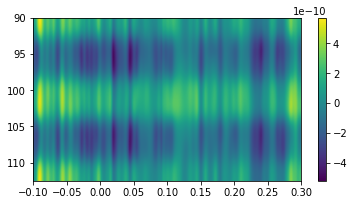

In [164]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
plt.imshow(Xhat_shiftedmean,aspect='auto', interpolation = 'gaussian',extent=[time[0],time[-1],x_centeredlabels[0], x_centeredlabels[-1]])
plt.colorbar()
ax.set_xtickslabels(time)
ax.set_Yticklabels(x_centeredlabels.astype(str))


In [ ]:
x_labels = np.array([  0. ,  22.5,  45. ,  67.5,  90. , 112.5, 135. , 157.5])
Xhat_centeredmean = np.mean(Xhat_centered, axis = 1)
Xhat_centeredsem = np.std(m_centered, axis = 1)/Xhat.shape[1]
Xhat_shiftedmean = np.roll(Xhat_centeredmean, 3, axis = 0)
Xhat_shiftedsem = np.roll(Xhat_centeredsem, 3, axis = 0)
x_centeredlabels = np.roll(x_labels,  3, axis = 0)

AttributeError: 'AxesSubplot' object has no attribute 'set_xtickslabels'

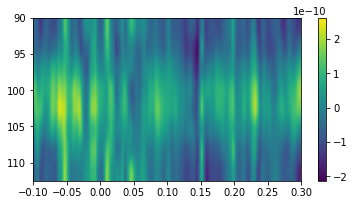

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
plt.imshow(Xhat_shiftedmean,aspect='auto', interpolation = 'gaussian',extent=[time[0],time[-1],x_centeredlabels[0], x_centeredlabels[-1]])
plt.colorbar()
ax.set_xtickslabels(time)
ax.set_Yticklabels(x_centeredlabels.astype(str))